# Customer Behaviour Analysis: A Real-World Case Study

# 1. Project Overview

## Title: Analyzing Customer Behaviour Data To Extract Impactful Insights

### Data Source: [Kaggle Link]("https://www.kaggle.com/datasets/sanyamgoyal401/customer-purchases-behaviour-dataset")

# Objective: 

### To analyze and unserstand customer baviour accross demographics, age, education and purchasing patterns to provide actionable insights for improving marketing efficiency, customer satisfaction,uncover interactions, and extract business-relevant insights.

# 2. EXPLORATORY EXPLORATION

In [18]:
#import necessary libs for data exploration
import pandas as pd # Data manipulation lib
import numpy as np # numerical python for linear algebraic operations
import seaborn as sns # visualization 
import matplotlib.pyplot as plt # base lib for visualization
import plotly.express as px # interactive graphs 
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

In [19]:
# set consistent visual style 
sns.set_style('whitegrid')

In [20]:
# load data
df = pd.read_csv('customer_data.csv')

# Display first few rows
df.head()

,id,age,gender,income,education,region,loyalty_status,purchase_frequency,purchase_amount,product_category,promotion_usage,satisfaction_score
0,1,27,Male,40682,Bachelor,East,Gold,frequent,18249,Books,0,6
1,2,29,Male,15317,Masters,West,Regular,rare,4557,Clothing,1,6
2,3,37,Male,38849,Bachelor,West,Silver,rare,11822,Clothing,0,6
3,4,30,Male,11568,HighSchool,South,Regular,frequent,4098,Food,0,7
4,5,31,Female,46952,College,North,Regular,occasional,19685,Clothing,1,5


In [5]:
# Shape of the data

shape = df.shape

shape

(100000, 12)

In [61]:
# Check for missing values

missing_values = df.isna().sum()

missing_values

id                    0
age                   0
gender                0
income                0
education             0
region                0
loyalty_status        0
purchase_frequency    0
purchase_amount       0
product_category      0
promotion_usage       0
satisfaction_score    0
dtype: int64

In [64]:
# Data types

data_types = df.dtypes

data_types

id                     int64
age                    int64
gender                object
income                 int64
education             object
region                object
loyalty_status        object
purchase_frequency    object
purchase_amount        int64
product_category      object
promotion_usage        int64
satisfaction_score     int64
dtype: object

In [67]:
# Columns

columns = df.columns.tolist()
columns

['id',
 'age',
 'gender',
 'income',
 'education',
 'region',
 'loyalty_status',
 'purchase_frequency',
 'purchase_amount',
 'product_category',
 'promotion_usage',
 'satisfaction_score']

# 3. Data Preprocessing

In [69]:
# get general info about the data
print("Dataset Info:")
df.info()

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   id                  100000 non-null  int64 
 1   age                 100000 non-null  int64 
 2   gender              100000 non-null  object
 3   income              100000 non-null  int64 
 4   education           100000 non-null  object
 5   region              100000 non-null  object
 6   loyalty_status      100000 non-null  object
 7   purchase_frequency  100000 non-null  object
 8   purchase_amount     100000 non-null  int64 
 9   product_category    100000 non-null  object
 10  promotion_usage     100000 non-null  int64 
 11  satisfaction_score  100000 non-null  int64 
dtypes: int64(6), object(6)
memory usage: 9.2+ MB


In [70]:
# get descriptive statistics 
print("Descriptive Statistics:")
df.describe()

Descriptive Statistics:


,id,age,income,purchase_amount,promotion_usage,satisfaction_score
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,50000.500000,30.003260,27516.269880,9634.790840,0.300800,5.009650
std,28867.657797,4.480535,12996.782587,4799.339449,0.458608,1.038714
min,1.000000,12.000000,5000.000000,1118.000000,0.000000,0.000000
25%,25000.750000,27.000000,16271.750000,5583.000000,0.000000,4.000000
50%,50000.500000,30.000000,27584.500000,9452.000000,0.000000,5.000000
75%,75000.250000,33.000000,38747.250000,13350.000000,1.000000,6.000000
max,100000.000000,49.000000,50000.000000,26204.000000,1.000000,10.000000


# 4. DEMOGRAPHIC OVERVIEW    

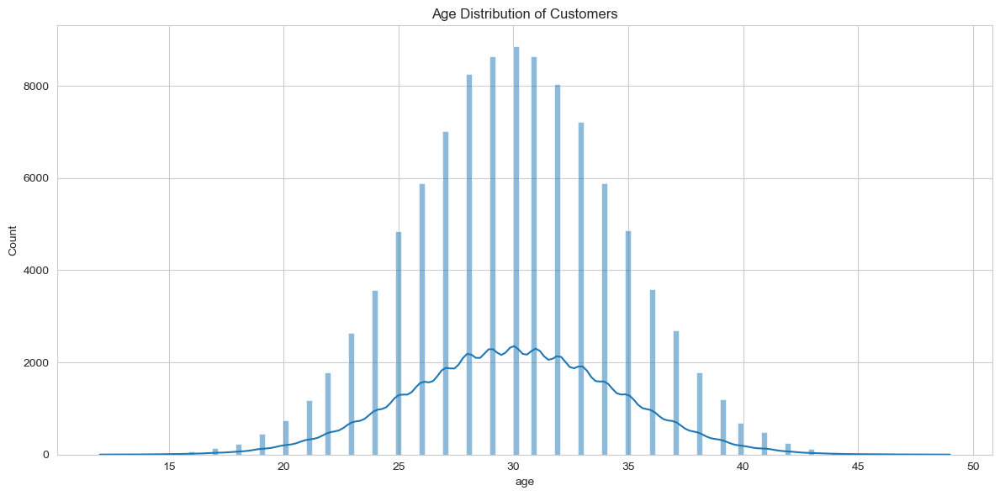

In [91]:
# Age distribution of all customers
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='age' ,kde=True)
plt.title('Age Distribution of Customers')
plt.tight_layout()

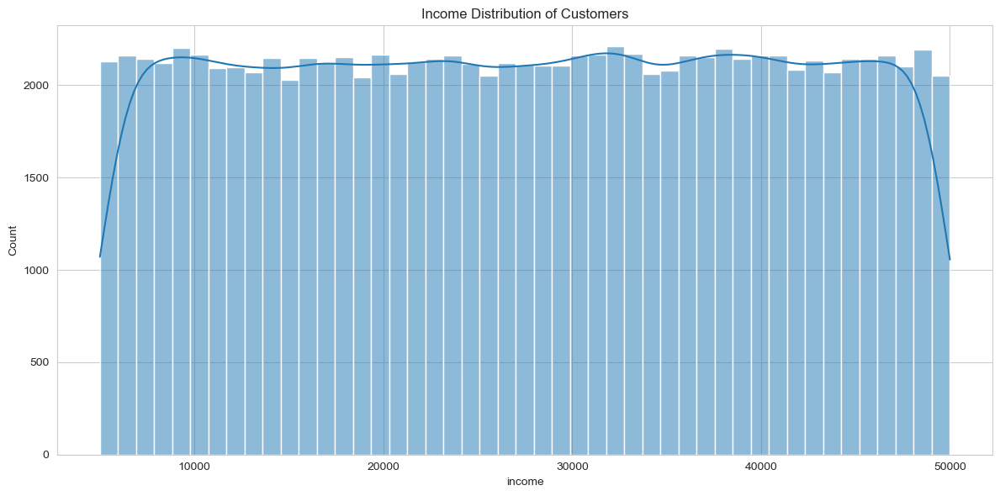

In [90]:
# Income distribution of all customers
plt.figure(figsize=(12,6))
sns.histplot(data=df, x='income', kde=True)
plt.title('Income Distribution of Customers')
plt.tight_layout()

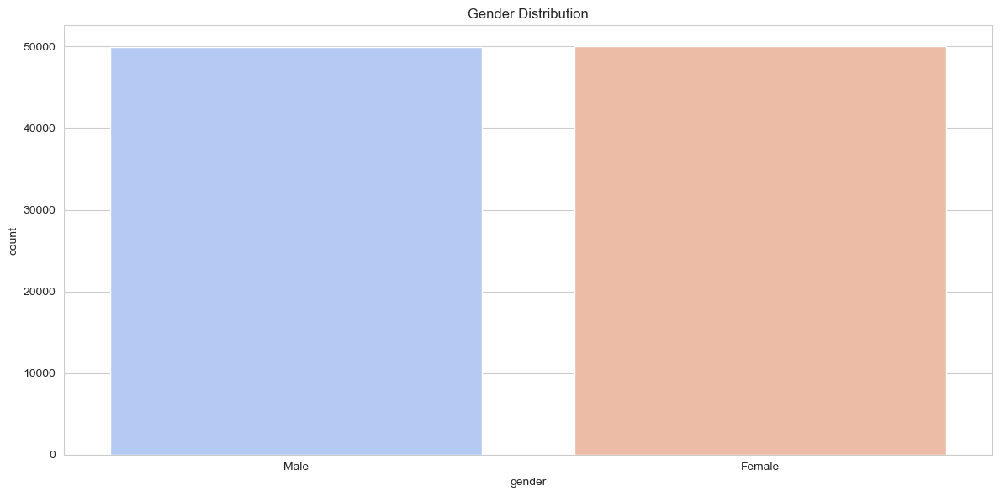

In [89]:
# Gender Distribution 
plt.figure(figsize=(12,6))
sns.countplot(df,x='gender', palette='coolwarm')
plt.title('Gender Distribution')
plt.tight_layout()

In [92]:
df.head()

,id,age,gender,income,education,region,loyalty_status,purchase_frequency,purchase_amount,product_category,promotion_usage,satisfaction_score
0,1,27,Male,40682,Bachelor,East,Gold,frequent,18249,Books,0,6
1,2,29,Male,15317,Masters,West,Regular,rare,4557,Clothing,1,6
2,3,37,Male,38849,Bachelor,West,Silver,rare,11822,Clothing,0,6
3,4,30,Male,11568,HighSchool,South,Regular,frequent,4098,Food,0,7
4,5,31,Female,46952,College,North,Regular,occasional,19685,Clothing,1,5


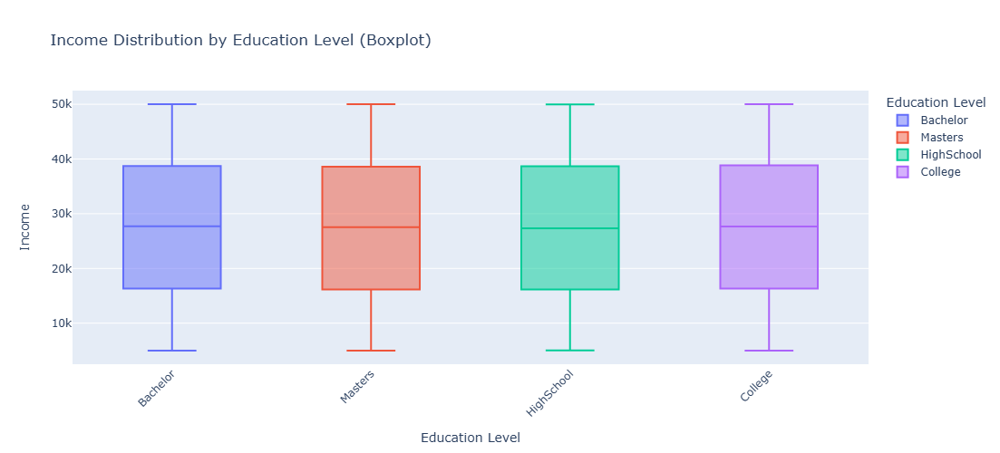

In [16]:
# Income Distribution by Education Level
fig_box = px.box(df, x='education', y='income', color='education',
                 title='Income Distribution by Education Level (Boxplot)',
                 labels={'income': 'Income', 'education': 'Education Level'},
                 height=500)
fig_box.update_layout(xaxis_tickangle=-45)
fig_box.show()

# 5. Behavioral Summary

In [127]:
df.head()

,id,age,gender,income,education,region,loyalty_status,purchase_frequency,purchase_amount,product_category,promotion_usage,satisfaction_score
0,1,27,Male,40682,Bachelor,East,Gold,frequent,18249,Books,0,6
1,2,29,Male,15317,Masters,West,Regular,rare,4557,Clothing,1,6
2,3,37,Male,38849,Bachelor,West,Silver,rare,11822,Clothing,0,6
3,4,30,Male,11568,HighSchool,South,Regular,frequent,4098,Food,0,7
4,5,31,Female,46952,College,North,Regular,occasional,19685,Clothing,1,5


In [ ]:
# Purchase Amount by Purchase Frequency
fig = px.box(df, x='purchase_frequency', y='purchase_amount', color='purchase_frequency',
             title='Purchase Amount by Purchase Frequency')
fig.show()

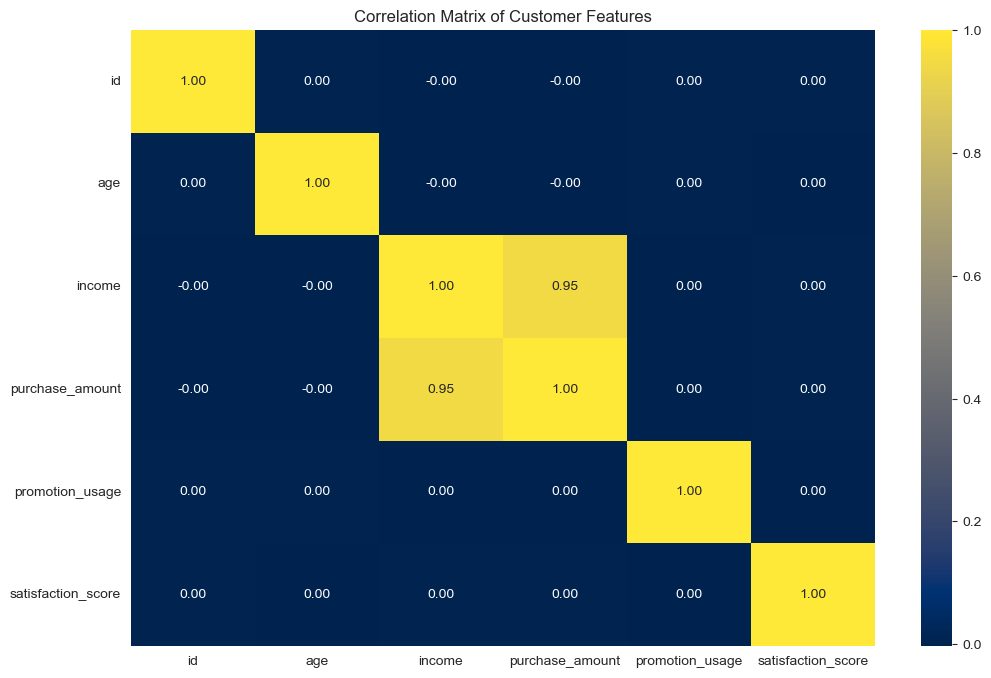

In [29]:
# Correlation Matrix of Customer Features
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(numeric_only=True),cmap='cividis', annot=True, fmt=".2f")
plt.title('Correlation Matrix of Customer Features')
plt.show()

Text(0.5, 1.02, 'Pairwise Relationships Between Features')

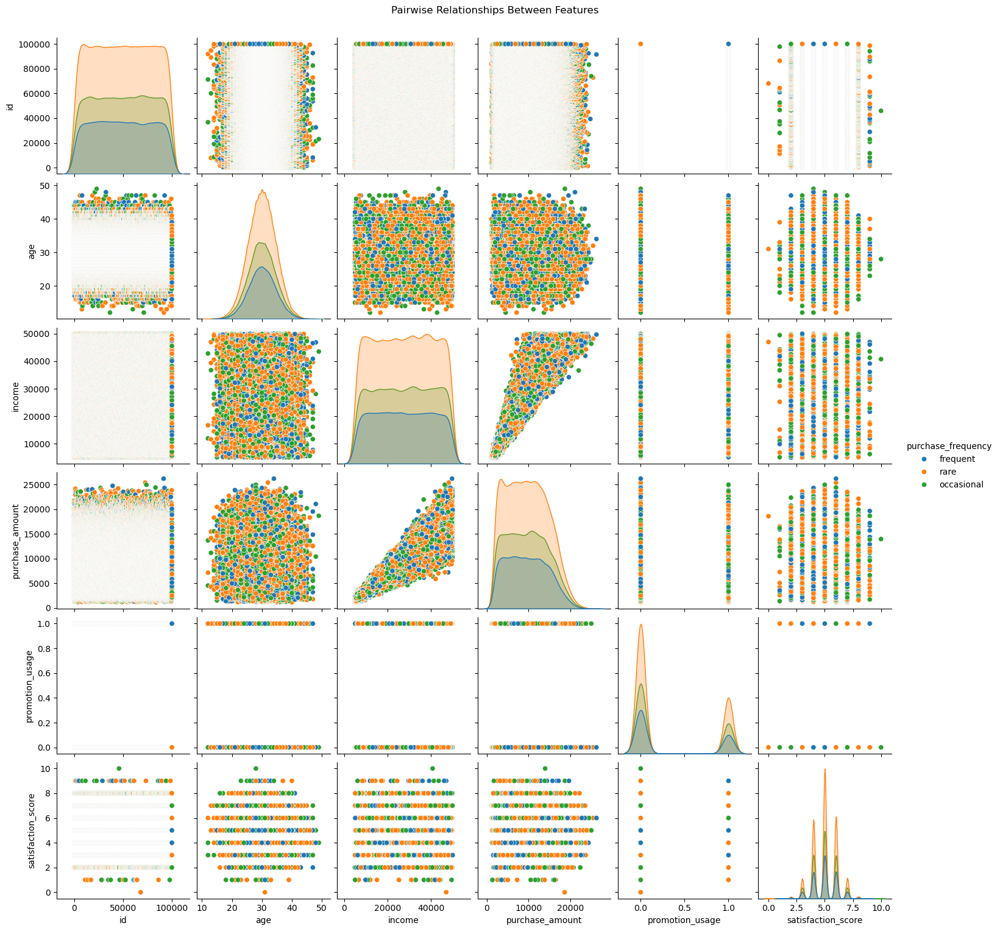

In [9]:
sns.pairplot(df, hue='purchase_frequency') # Use a categorical variable for hue
plt.suptitle('Pairwise Relationships Between Features', y=1.02)

In [22]:
# Define Age Groups based on age 
df['age_group'] = pd.cut(df['age'], bins=[18, 30, 45, 60, 100], labels=['18-30', '31-45', '46-60', '60+'])

In [23]:
# Group income levels based on income 
df['income_level'] = pd.cut(df['income'], bins=3, labels=['Low', 'Medium', 'High'])

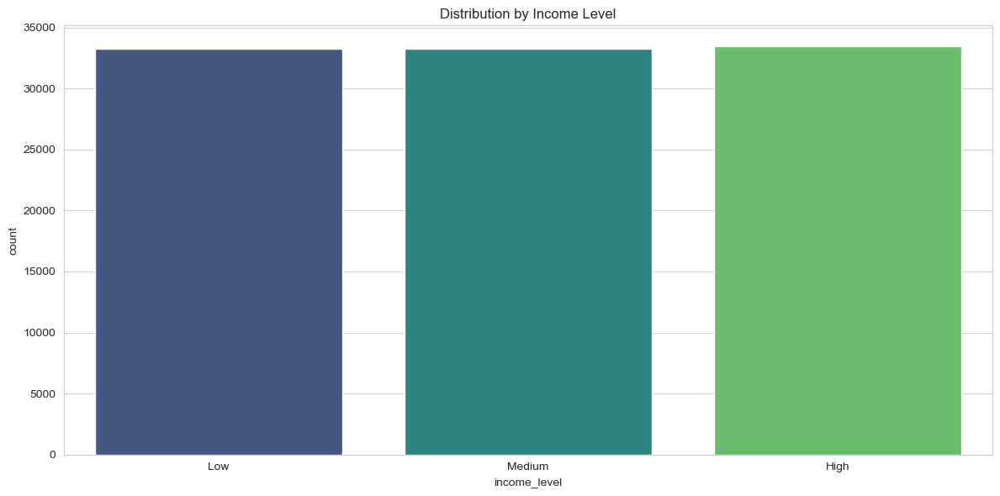

In [32]:
# Distribution by Income Level
plt.figure(figsize=(12,6))
sns.countplot(data=df, palette='viridis', x='income_level')
plt.title('Distribution by Income Level')
plt.tight_layout()

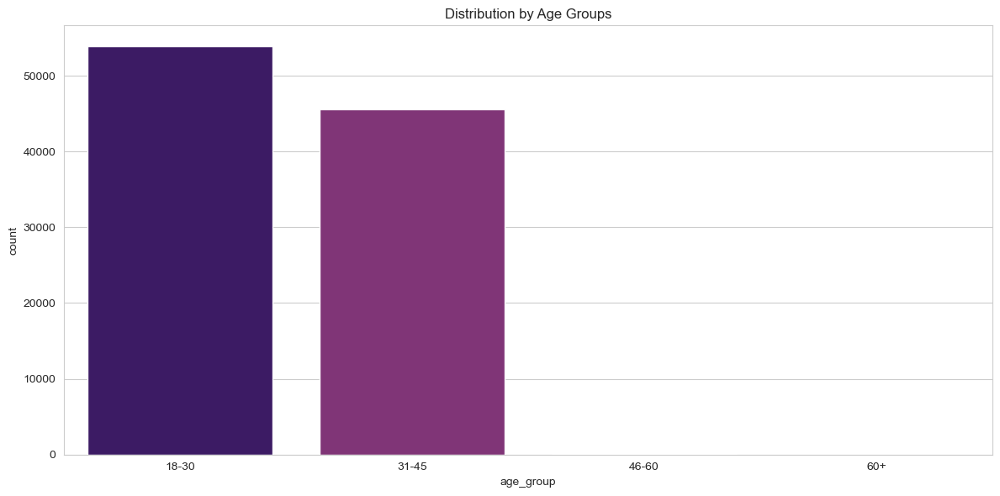

In [33]:
# Distribution by Age Group
plt.figure(figsize=(12,6))
sns.countplot(data=df, palette='magma', x='age_group')
plt.title('Distribution by Age Groups')
plt.tight_layout()

In [37]:
df.head()

,id,age,gender,income,education,region,loyalty_status,purchase_frequency,purchase_amount,product_category,promotion_usage,satisfaction_score,age_group,income_level
0,1,27,Male,40682,Bachelor,East,Gold,frequent,18249,Books,0,6,18-30,High
1,2,29,Male,15317,Masters,West,Regular,rare,4557,Clothing,1,6,18-30,Low
2,3,37,Male,38849,Bachelor,West,Silver,rare,11822,Clothing,0,6,31-45,High
3,4,30,Male,11568,HighSchool,South,Regular,frequent,4098,Food,0,7,18-30,Low
4,5,31,Female,46952,College,North,Regular,occasional,19685,Clothing,1,5,31-45,High


In [38]:
frequency_score_map = {
    'rare': 1,
    'occasional': 2,
    'frequent': 3
}

df['purchase_frequency_score'] = df['purchase_frequency'].map(frequency_score_map)

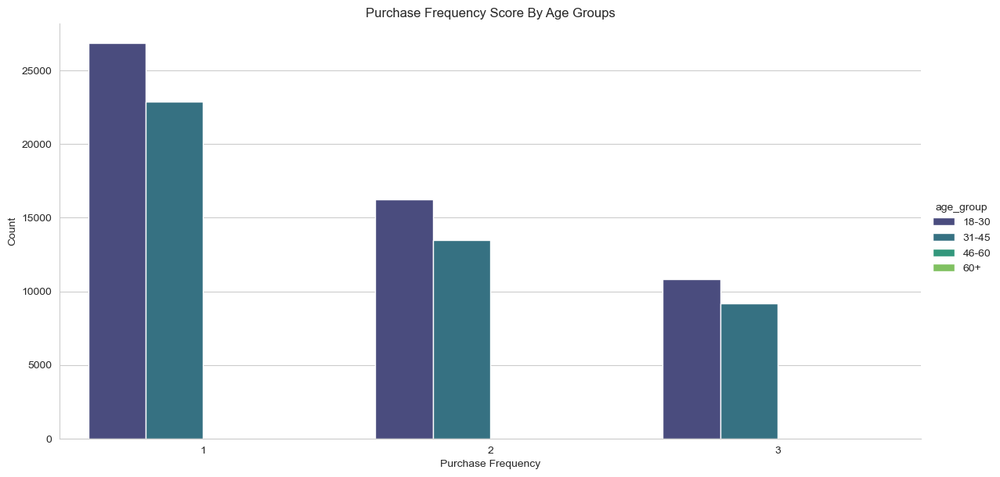

In [72]:
g = sns.catplot(data=df, x='purchase_frequency_score', hue='age_group', 
                kind='count', palette='viridis', height=6, aspect=2)
g.set(title="Purchase Frequency Score By Age Groups", 
      xlabel="Purchase Frequency", 
      ylabel="Count")
plt.show()

# SUMMARY 

- Younger (18–30) customers spend more and purchase more often
    - Launch age-targeted loyalty programs or referral incentives
- High-income customers are not always most satisfied
    - Review pricing vs. product category value proposition
- Customers with high satisfaction tend to buy fewer times, but spend more
  - Consider a VIP membership with early access or bundled deals   